In [1]:
import matplotlib
import local_models.local_models
import local_models.algorithms
import local_models.utils
import local_models.linear_projections
import local_models.loggin
import local_models.TLS_models
import numpy as np
import matplotlib.pyplot as plt
import sklearn.linear_model
import sklearn.cluster
from importlib import reload
from ml_battery.utils import cmap
import matplotlib as mpl
import sklearn.datasets
import sklearn.decomposition
import logging
import ml_battery.log
import time
import os
import pandas as pd
import scipy.fftpack
import gc
import patched_gpr
import sklearn.gaussian_process as gp
import importlib
np.random.seed(1)




logger = logging.getLogger(__name__)

#reload(local_models.local_models)
#reload(lm)
#reload(local_models.loggin)
#reload(local_models.TLS_models)
np.warnings.filterwarnings('ignore')

In [2]:
signal_subsample_rate = 5
SIGNAL_HZ = 250
HZ=int(SIGNAL_HZ/signal_subsample_rate)
EEG_CHANNELS=21
SECONDS_OF_SIGNAL=100
l = HZ*SECONDS_OF_SIGNAL
gpr_subsample_rate=10
bandwidth = 2*HZ
n = 2*bandwidth-1

RUN=2
WHICH_DATA_FILE=6
# run1 (5)...run2 (6)

In [3]:
mpl.rcParams['figure.figsize'] = [16.0*SECONDS_OF_SIGNAL/20, 8.0]
mpl.rcParams['font.size'] = int(mpl.rcParams['figure.figsize'][1]*4)

In [4]:
def adjust_ax_labels(axs, rng, n_ticks=8, hz=250):
    try:
        axs_iterator = iter(axs)
    except TypeError as te:
        axs_iterator = iter([axs])
    for ax in axs_iterator:
        ax.axis("off")
    ax.axis("on")
    x_ticks = np.linspace(rng[0],rng[1],n_ticks)
    x_tick_labels = x_ticks/hz
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(list(map(lambda x: "{:.01f}".format(x), x_tick_labels)))
    ax.get_yaxis().set_visible(False)
    ax.set_frame_on(False)        

In [5]:
#HB suggests using std(X)*n**(-1/5)... since std(X) depends crucially on the length of the signal, how can this help?

In [6]:
project_dir = "/home/brown/disk2/eeg/todd_eeg_rollingvar_run{:03d}".format(RUN)
os.makedirs(project_dir, exist_ok=1)

In [7]:
data_dir = "/home/brown/disk2/eeg/Phasespace/Phasespace/data/eeg-text"

In [8]:
data_info = pd.read_csv(os.path.join(data_dir, "fileinformation.csv"), skiprows=1).iloc[:,2:]

In [9]:
data_info

,Unnamed: 2,Number of Records,Time of Seizure,Unnamed: 5,Point of Seizure,250
0,DAT.F00012,3963799,14040,NaN,3510000,3510000
1,DAT.F00013,3632699,12720,NaN,3180000,3180000
2,DAT.F00016,4447824,15960,NaN,3990000,3990000
3,DAT.F00017,1827224,0,NaN,0,0
4,DAT.F00018,2985924,10020,NaN,2505000,2505000
5,DAT.F00019,3692374,12960,NaN,3240000,3240000
6,DAT.F00020,3270974,11280,NaN,2820000,2820000
7,DAT.F00022,2120524,0,NaN,0,0
8,DAT.F00024,3378499,11700,NaN,2925000,2925000
9,DAT.F00026,3370999,0,NaN,0,0


In [10]:
data_file = data_info.iloc[WHICH_DATA_FILE,0]

In [11]:
data_epipoint = int(data_info.iloc[WHICH_DATA_FILE,4]/signal_subsample_rate)

In [12]:
data_epipoint

564000

In [13]:
dat = np.loadtxt(os.path.join(data_dir, data_file))

In [14]:
#a computationally convenient approximation to the beta... sig on [0,1]
def kumaraswamy(sig,a=1.,b=1.):
    return a*b*sig**(a-1)*(1-sig**a)**(b-1)
def spectrum(sig, d):
    f = scipy.fftpack.rfftfreq(sig.size, d=d)
    y = scipy.fftpack.rfft(sig)
    return f, y
def kumaraswamy_filter(sig,d,a=1.,b=1.):
    f, y = spectrum(sig, d)
    max_f = np.max(f)
    kumaraswamy_filter = kumaraswamy(f/max_f,a,b)
    kumaraswamy_filter /= np.max(kumaraswamy_filter) #scale units
    y *= kumaraswamy_filter
    filtered_sig = scipy.fftpack.irfft(y)
    return filtered_sig

In [15]:
a = 1.2; b=10.
filtered_data_dir = os.path.join(data_dir, "filtered_data")
os.makedirs(filtered_data_dir, exist_ok=1)
filtered_data_filename = os.path.join(filtered_data_dir, "kumaraswamy_filtered_data_eeg{}_a{:05.02f}_b{:05.02f}".format(data_file, a, b))

In [16]:
if not os.path.isfile(filtered_data_filename):
    filtered_dat = np.empty(dat[:,:EEG_CHANNELS].shape)
    for channel in range(EEG_CHANNELS):
        print(channel)
        filtered_dat[:,channel] = kumaraswamy_filter(dat[:,channel],1/SIGNAL_HZ,a,b)
    np.savetxt(filtered_data_filename, filtered_dat)
else:
    filtered_dat = np.loadtxt(filtered_data_filename)

In [17]:
subsampled_dat = filtered_dat[::signal_subsample_rate]

In [18]:
ictal_rng = (max(0,data_epipoint-l), min(subsampled_dat.shape[0], data_epipoint+l))
negative_ictal_rng = (max(0, int(data_epipoint/2)-l), min(subsampled_dat.shape[0], int(data_epipoint/2)+l))
subsample_ictal_rng = (np.array(ictal_rng)/gpr_subsample_rate).astype(int)
subsample_negative_ictal_rng = (np.array(negative_ictal_rng)/gpr_subsample_rate).astype(int)
lm_kernel = local_models.local_models.TriCubeKernel(bandwidth=bandwidth)
index_X = np.arange(subsampled_dat.shape[0]*1.).reshape(-1,1)
index = local_models.local_models.ConstantDistanceSortedIndex(index_X.flatten())
exemplar_rng = (HZ*4,HZ*4+n) 
exemplar_X = index_X[slice(*exemplar_rng)]
ictal_X = index_X[slice(*ictal_rng)]
ictal_X_gpr_subsampled = index_X[ictal_rng[0] : ictal_rng[1] : gpr_subsample_rate]
exemplar_X_gpr_subsampled = index_X[exemplar_rng[0] : exemplar_rng[1] : gpr_subsample_rate]
negative_ictal_X = index_X[slice(*negative_ictal_rng)]
negative_ictal_X_gpr_subsampled = index_X[negative_ictal_rng[0] : negative_ictal_rng[1] : gpr_subsample_rate]

In [19]:
class RollingVariance(object):
    def fit(self, X, y, sample_weight=None):
        Ex = np.average(y,weights=sample_weight)
        Ex2 = np.average(y**2,weights=sample_weight)
        self.intercept_ = np.ones((1,)) * (Ex2 - Ex**2)
        self.coef_ = np.empty((0,))
        return self
    def clone(self):
        return self
    def get_params(self,*args,**kwargs):
        return {}

In [20]:
f,y = spectrum(subsampled_dat[:,0],1/HZ)

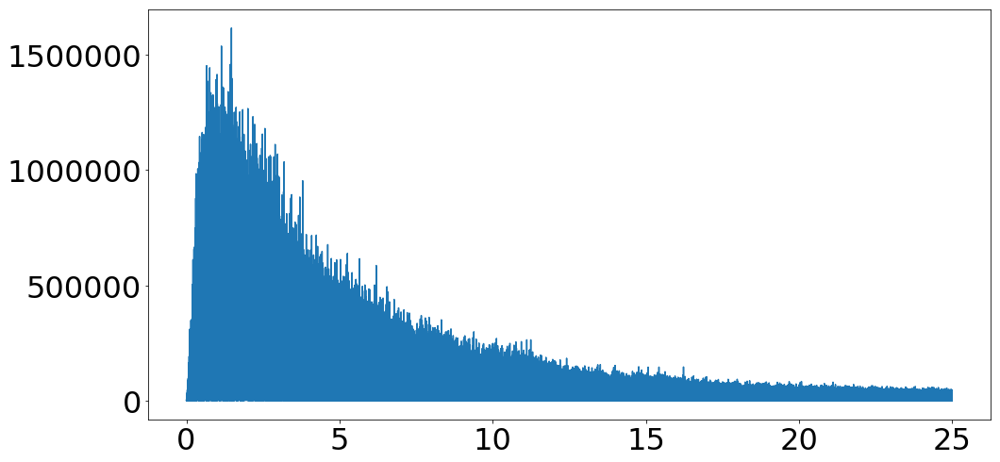

In [21]:
fig = plt.figure(figsize=(16,8))
plt.plot(f,np.abs(y))

In [22]:
f,y = spectrum(filtered_dat[:,0],1/SIGNAL_HZ)

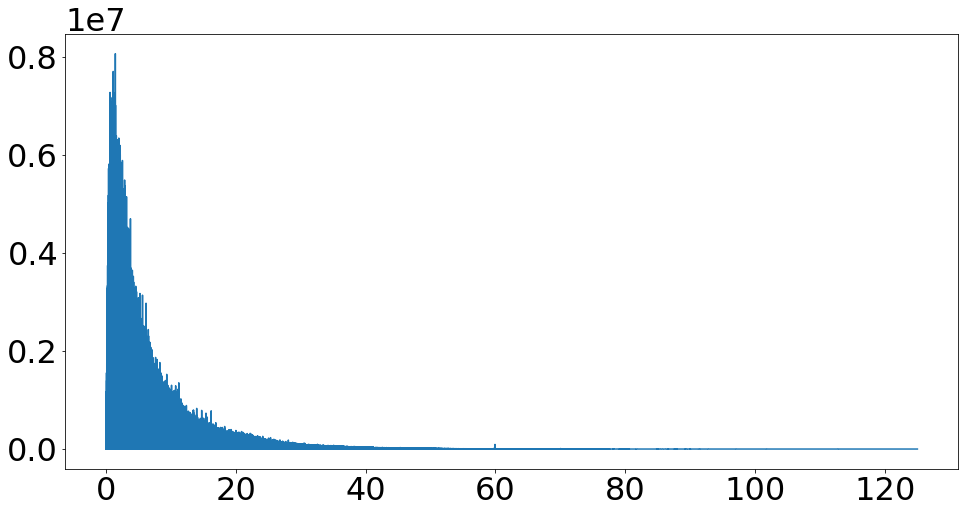

In [23]:
fig = plt.figure(figsize=(16,8))
plt.plot(f,np.abs(y))

In [24]:
filtered_local_regressor = RollingVariance()
y = subsampled_dat[:,0]
lm_kernel = local_models.local_models.TriCubeKernel(bandwidth=bandwidth)
filtered_gpr_models = local_models.local_models.LocalModels(filtered_local_regressor)
filtered_gpr_models.fit(index_X,y,index=index)

In [25]:
filtered_gpr_params = filtered_gpr_models.transform(ictal_X_gpr_subsampled,r=lm_kernel.support_radius()-1,weighted=True,kernel=lm_kernel,neighbor_beta0s=False, batch_size=int((subsample_ictal_rng[1] - subsample_ictal_rng[0])/10))

In [26]:
def clear(fig, axs):
    for ax in axs:
        ax.clear()
    fig.clear()
    plt.close(fig)
    plt.close("all")

In [27]:
def plt_gpr_params(X, y, gpr_X, gpr_params, epipoint, filename, hz=HZ):
    fig, axs = plt.subplots(2, sharex=True, gridspec_kw={'hspace': 0})
    adjust_ax_labels(axs,(np.min(X), np.max(X)),hz=HZ)
    artists = []
    colors = (color for color in plt.rcParams['axes.prop_cycle'].by_key()['color'])
    for var in range(gpr_params.shape[1]):
        c = next(colors)
        ar = axs[0].plot(gpr_X, gpr_params[:,var],c=c)
        artists.append(ar[0])
    if epipoint is not None:
        c = next(colors)
        for ax in axs:
            ar = ax.axvline(epipoint,c=c,lw=5)
        artists.append(ar)
    c = next(colors)
    ar = axs[1].plot(X, y, c=c)
    artists.append(ar[0])
    if filename is not None:
        plt.savefig(filename)


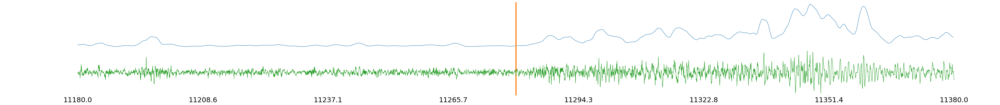

In [28]:
plt_gpr_params(ictal_X, subsampled_dat[slice(*ictal_rng),0], ictal_X_gpr_subsampled, filtered_gpr_params, data_epipoint, None)

## Transform all of the channels

In [29]:
transformed_data_dir = os.path.join(project_dir, "transformed_data_fixed_rbf_{:03d}".format(RUN))
os.makedirs(transformed_data_dir, exist_ok=1)
transformed_data_img_dir = os.path.join(transformed_data_dir, "transformed_data_imgs")
os.makedirs(transformed_data_img_dir, exist_ok=1)

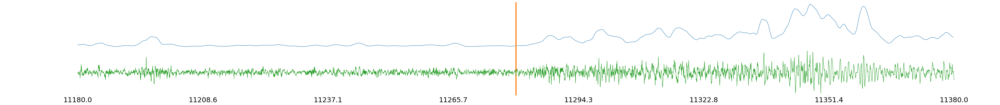

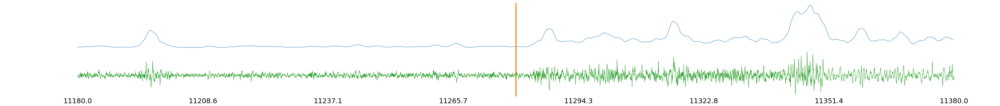

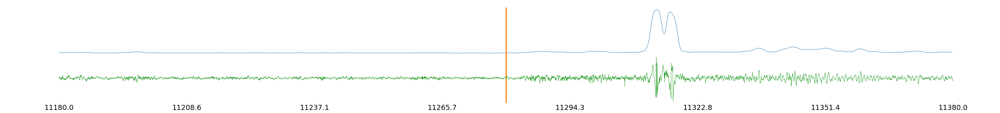

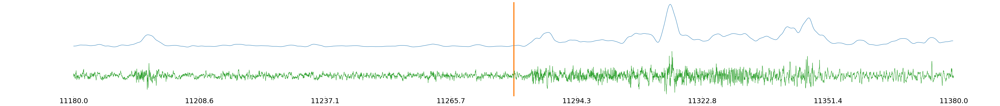

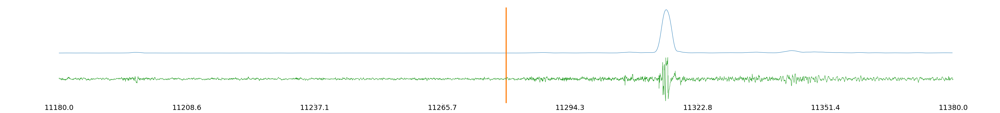

...

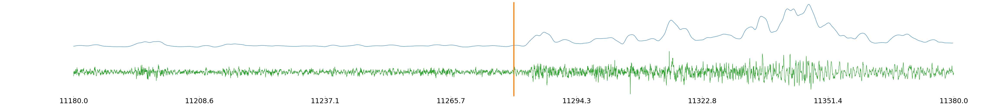

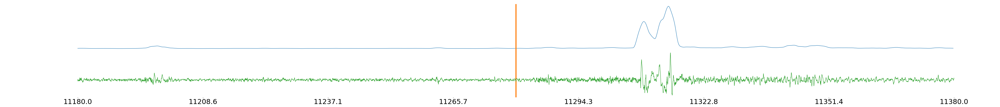

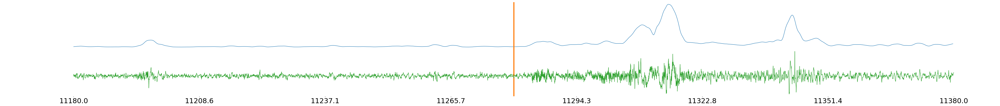

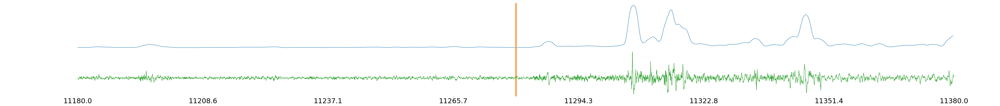

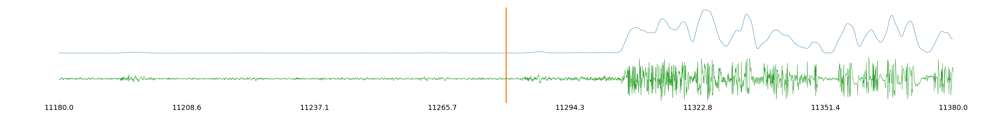

In [30]:
timelog = local_models.local_models.loggin.TimeLogger(
    logger=logger, 
    how_often=1, total=EEG_CHANNELS, 
    tag="local gpr eeg transform eeg{}".format(data_file))

gpr_paramses = np.empty((ictal_X_gpr_subsampled.shape[0], 1, EEG_CHANNELS))
for channel in range(EEG_CHANNELS):
    with timelog:
        transformed_data_filename = os.path.join(transformed_data_dir, "gpr_transformed_data_k{}_rng{}_channel{:03d}.dat".format(str(lm_kernel), str(ictal_rng), channel))
        #fit the local models
        filtered_local_regressor = RollingVariance()
        y = subsampled_dat[:,channel]
        filtered_gpr_models = local_models.local_models.LocalModels(filtered_local_regressor)
        filtered_gpr_models.fit(index_X,y,index=index)
        gpr_params = filtered_gpr_models.transform(index_X[ictal_rng[0]:ictal_rng[1]:gpr_subsample_rate,:],r=lm_kernel.support_radius()-1,weighted=True,kernel=lm_kernel,neighbor_beta0s=False, batch_size=int((subsample_ictal_rng[1] - subsample_ictal_rng[0])/10))
        gpr_paramses[:,:,channel] = gpr_params
        transformed_data_img_filename = os.path.join(transformed_data_img_dir, "gpr_transformed_data_k{}_rng{}_channel{:03d}.png".format(str(lm_kernel), str(ictal_rng), channel))
        plt_gpr_params(ictal_X, subsampled_dat[slice(*ictal_rng),channel], ictal_X_gpr_subsampled, gpr_params, data_epipoint, transformed_data_img_filename)

In [31]:
def fit_meanshift(gpr_paramses, kernel):
    mean_regressor = local_models.TLS_models.LinearODR_mD(0)
    mean_models = local_models.local_models.LocalModels(mean_regressor)
    mean_models.fit(gpr_paramses)
    for i, (dat, report) in enumerate(local_models.algorithms.local_tls_shift_till_convergence(
                mean_models, gpr_paramses, kernel=kernel, report=True)):
        if not i%100:
            #print(report)
            pass
    return dat
    
def cleanup_meanshift(meanshifted_data, tol=1e-7): 
    import sklearn.neighbors
    bt = sklearn.neighbors.BallTree(meanshifted_data)
    bins = bt.query_radius(meanshifted_data, r=tol)
    cleanuped = np.empty(meanshifted_data.shape)
    for i, the_bin in enumerate(bins):
        cleanuped[i] = np.mean(meanshifted_data[the_bin], axis=0)
    return cleanuped
    
def pick_optimal_meanshift_bandwidth(initial_bandwidths, gpr_paramses, iterations=7):
    #go middle of the road to get two clusters.
    #i.e. find the minimum bandwidth giving 3, the max giving 1, then take their average
    print(iterations)
    checked_bandwidths = []
    given_n_clusters = []
    if iterations == 0:
        return checked_bandwidths, given_n_clusters
    for bandwidth in initial_bandwidths:
        ms_kernel = local_models.local_models.TriCubeKernel(bandwidth=bandwidth)
        fitted_meanshift = fit_meanshift(gpr_paramses, ms_kernel)
        fitted_meanshift = cleanup_meanshift(fitted_meanshift)
        observed_clusters = np.unique(fitted_meanshift, axis=0).shape[0]
        checked_bandwidths.append(bandwidth)
        given_n_clusters.append(observed_clusters)
    #get half of the ones, and half of the twos:
    the_ones = [checked_bandwidths[i] for i in range(len(checked_bandwidths)) if given_n_clusters[i]==1]
    the_twos = [checked_bandwidths[i] for i in range(len(checked_bandwidths)) if given_n_clusters[i]==2]
    the_more_than_twos = [checked_bandwidths[i] for i in range(len(checked_bandwidths)) if given_n_clusters[i]>2]
    median_the_ones = np.median(the_ones) if the_ones else max(initial_bandwidths)*2
    median_the_more_than_twos = np.median(the_more_than_twos) if the_more_than_twos else min(initial_bandwidths)/2
    median_the_twos = np.median(the_twos) if the_twos else np.mean([median_the_ones, median_the_more_than_twos])
    sub_checked, sub_n_clusters = pick_optimal_meanshift_bandwidth(
        np.concatenate((
            np.linspace(median_the_more_than_twos, median_the_twos, len(initial_bandwidths)),
            np.linspace(median_the_twos, median_the_ones, len(initial_bandwidths))
        )),
        gpr_paramses,
        iterations - 1
    )
    return checked_bandwidths + sub_checked, given_n_clusters + sub_n_clusters 

In [32]:
def mean_d_half_neighbors(dat):
    import sklearn.neighbors
    bt = sklearn.neighbors.BallTree(dat)
    dz, iz = bt.query(dat, k=int(dat.shape[0]/2), return_distance=True, sort_results=True)
    return np.mean([dz[i][-1] for i in range(len(dz))])

In [33]:
flattened_params = gpr_paramses.transpose([0,2,1]).reshape(gpr_params.shape[0],-1)

In [34]:
half_neighbor_d = mean_d_half_neighbors(flattened_params)

In [35]:
bs, ns = pick_optimal_meanshift_bandwidth([half_neighbor_d, half_neighbor_d/4, half_neighbor_d/16], flattened_params)

7
6
5
4
3
2
1
0


In [36]:
sorted_bs_indices = sorted(list(range(len(bs))), key=lambda i: bs[i])
sorted_bs = [bs[i] for i in sorted_bs_indices]
sorted_ns = [ns[i] for i in sorted_bs_indices]

In [37]:
list(zip(sorted_ns, sorted_bs))

[(353, 155754.2647772996),
 (127, 623017.0591091984),
 (127, 623017.0591091984),
 (39, 1713296.9125502955),
 (16, 2492068.2364367936),
 (14, 2803576.7659913925),
 (14, 2803576.7659913925),
 (14, 2803576.7659913925),
 (10, 3520046.3839669707),
 (10, 3893856.61943249),
 (10, 4236516.001942549),
 (6, 4952985.619918128),
 (6, 4984136.472873587),
 (5, 5669455.237893706),
 (5, 5669455.237893706),
 (5, 5897422.843613208),
 (5, 6125390.44933271),
 (6, 6353358.055052212),
 (9, 6385924.855869284),
 (9, 6385924.855869284),
 (20, 6467341.857911963),
 (5, 6548758.859954642),
 (5, 6581325.6607717145),
 (5, 6630175.861997322),
 (5, 6711592.864040001),
 (4, 6793009.86608268),
 (4, 6809293.266491218),
 (3, 6874426.8681253595),
 (3, 6874426.8681253595),
 (3, 6907415.44064589),
 (3, 6940404.013166421),
 (3, 6955843.87016804),
 (3, 6973392.585686951),
 (3, 7006381.158207482),
 (3, 7037260.872210719),
 (3, 7037260.872210719),
 (3, 7039369.7307280125),
 (3, 7072358.303248543),
 (3, 7102394.473844862),
 (3, 

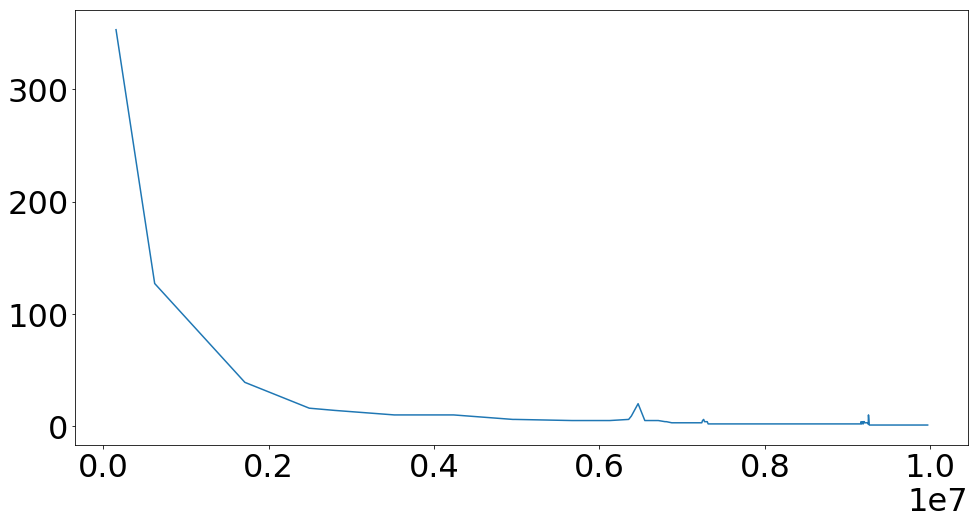

In [38]:
fig = plt.figure(figsize=(16,8))
plt.plot(np.array(sorted_bs), sorted_ns)
plt.ticklabel_format(style='sci', axis='x',scilimits=(0,0))

### The optimal bandwidth is something that robustly gives 2 clusters

In [39]:
optimal_bandwidth = np.median([bs[i] for i in range(len(bs)) if ns[i] ==2])
optimal_bandwidth

8397187.620834172

## Do the same stuff for a non-ictal range, use the same gpr bandwidth, investigate the mean shift bandwidths...

In [40]:
transformed_negative_data_dir = os.path.join(project_dir, "transformed_negative_data_fixed_rbf_{:03d}".format(RUN))
os.makedirs(transformed_negative_data_dir, exist_ok=1)
transformed_negative_data_img_dir = os.path.join(transformed_negative_data_dir, "transformed_negative_data_imgs")
os.makedirs(transformed_negative_data_img_dir, exist_ok=1)

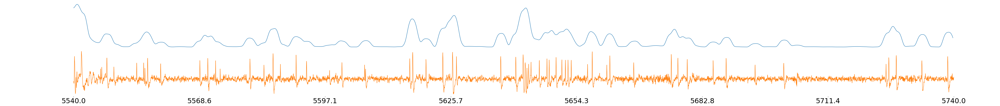

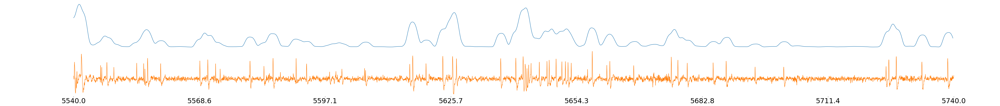

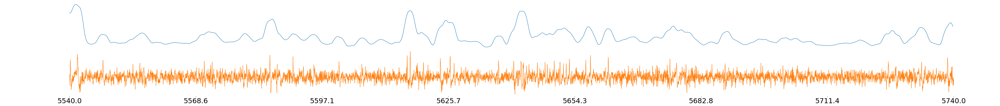

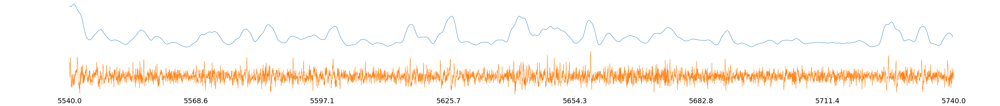

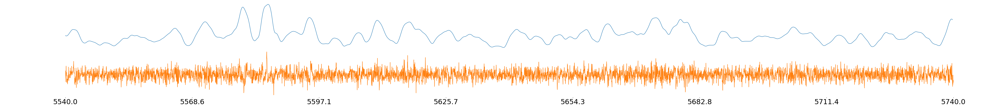

...

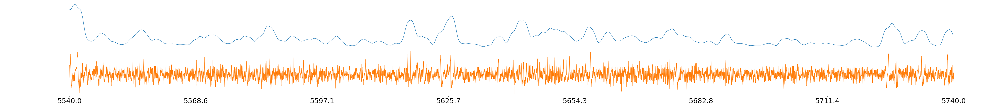

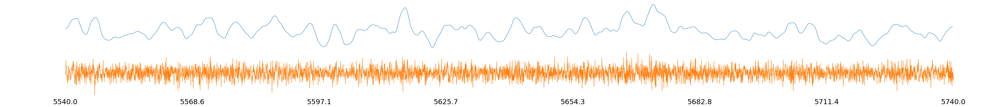

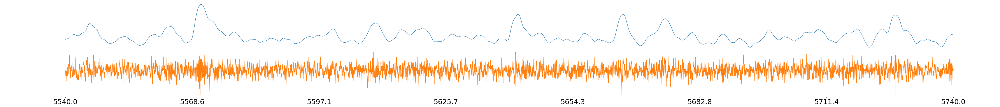

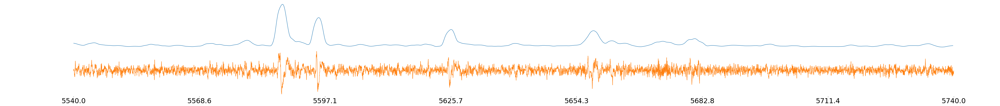

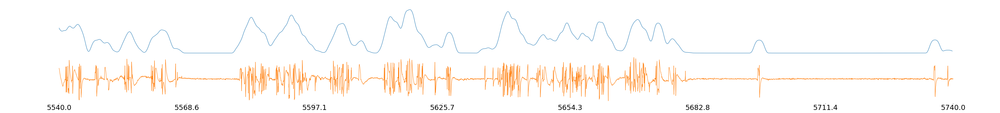

In [41]:
timelog = local_models.local_models.loggin.TimeLogger(
    logger=logger, 
    how_often=1, total=EEG_CHANNELS, 
    tag="local gpr eeg transform eeg{}".format(data_file))

gpr_paramses = np.empty((negative_ictal_X_gpr_subsampled.shape[0], 1, EEG_CHANNELS))
for channel in range(EEG_CHANNELS):
    with timelog:
        transformed_data_filename = os.path.join(transformed_negative_data_dir, "gpr_transformed_data_k{}_rng{}_channel{:03d}.dat".format(str(lm_kernel), str(negative_ictal_rng), channel))
        #fit the local models
        filtered_local_regressor = RollingVariance()
        y = subsampled_dat[:,channel]
        filtered_gpr_models = local_models.local_models.LocalModels(filtered_local_regressor)
        filtered_gpr_models.fit(index_X,y,index=index)
        gpr_params = filtered_gpr_models.transform(index_X[negative_ictal_rng[0]:negative_ictal_rng[1]:gpr_subsample_rate,:],r=lm_kernel.support_radius()-1,weighted=True,kernel=lm_kernel,neighbor_beta0s=False, batch_size=int((subsample_negative_ictal_rng[1] - subsample_negative_ictal_rng[0])/10))
        gpr_paramses[:,:,channel] = gpr_params
        transformed_data_img_filename = os.path.join(transformed_negative_data_img_dir, "gpr_transformed_data_k{}_rng{}_channel{:03d}.png".format(str(lm_kernel), str(negative_ictal_rng), channel))
        plt_gpr_params(negative_ictal_X, subsampled_dat[slice(*negative_ictal_rng),channel], negative_ictal_X_gpr_subsampled, gpr_params, None, transformed_data_img_filename)

In [42]:
flattened_negative_params = gpr_paramses.transpose([0,2,1]).reshape(gpr_params.shape[0],-1)

In [43]:
half_neighbor_d = mean_d_half_neighbors(flattened_negative_params)

In [44]:
negative_bs, negative_ns = pick_optimal_meanshift_bandwidth([half_neighbor_d, half_neighbor_d/4, half_neighbor_d/16], flattened_negative_params)

7
6
5
4
3
2
1
0


In [45]:
sorted_negative_bs_indices = sorted(list(range(len(negative_bs))), key=lambda i: negative_bs[i])
sorted_negative_bs = [negative_bs[i] for i in sorted_negative_bs_indices]
sorted_negative_ns = [negative_ns[i] for i in sorted_negative_bs_indices]

In [46]:
list(zip(sorted_negative_bs, sorted_negative_ns))

[(195708.20926769436, 117),
 (489270.5231692359, 53),
 (782832.8370707774, 13),
 (1149785.7294477043, 7),
 (1149785.7294477043, 7),
 (1281888.770703398, 7),
 (1413991.8119590916, 9),
 (1546094.8532147855, 7),
 (1546094.8532147855, 7),
 (1570113.587988548, 7),
 (1594132.3227623105, 494),
 (1618151.0575360728, 10),
 (1642169.7923098353, 7),
 (1666188.5270835978, 8),
 (1678197.894470479, 8),
 (1690207.2618573604, 6),
 (1702216.6292442416, 8),
 (1709265.6057539328, 131),
 (1714225.996631123, 4),
 (1716314.582263624, 4),
 (1723363.558773315, 8),
 (1730412.5352830063, 6),
 (1737461.5117926975, 4),
 (1738244.7314048852, 5),
 (1744510.4883023887, 2),
 (1751559.4648120797, 2),
 (1758608.441321771, 6),
 (1762263.4661786477, 4),
 (1765657.417831462, 2),
 (1772706.3943411533, 4),
 (1779755.3708508445, 2),
 (1786282.2009524102, 2),
 (1786804.3473605355, 2),
 (1793853.3238702267, 2),
 (1800902.300379918, 2),
 (1807951.2768896092, 2),
 (1810300.9357261728, 2),
 (1810300.9357261728, 2),
 (1810300.9357

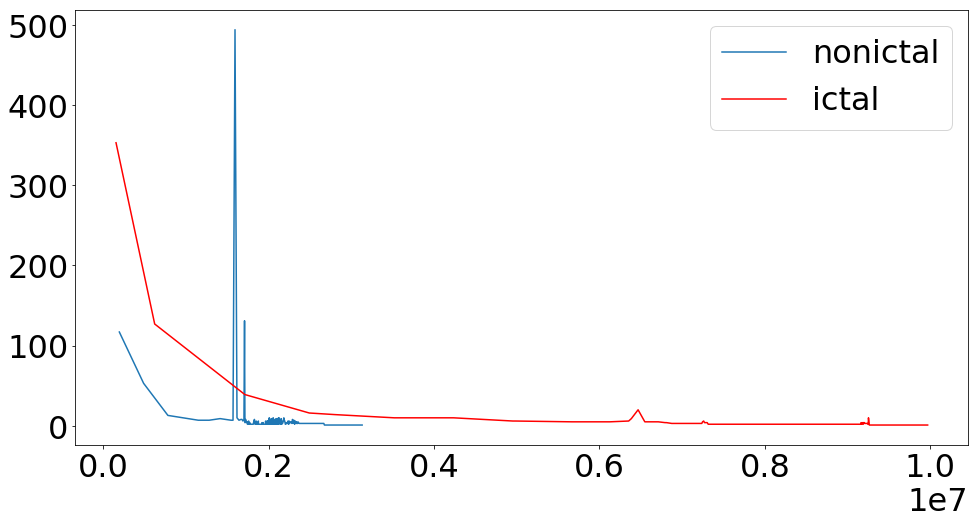

In [47]:
fig = plt.figure(figsize=(16,8))
plt.plot(sorted_negative_bs, sorted_negative_ns)
plt.plot(sorted_bs,sorted_ns,c='r')
plt.legend(["nonictal", "ictal"])
plt.ticklabel_format(style='sci', axis='x',scilimits=(0,0))
plt.savefig(os.path.join(project_dir, "meanshift_clusters_ictal_vs_nonictal.png"))

In [48]:
nonictal_bandwidths_filename = os.path.join(project_dir, "nonictal_meanshift_bandwidths.dat")
np.savetxt(nonictal_bandwidths_filename, list(zip(sorted_negative_bs, sorted_negative_ns)))
np.loadtxt(nonictal_bandwidths_filename)

array([[1.95708209e+05, 1.17000000e+02],
       [4.89270523e+05, 5.30000000e+01],
       [7.82832837e+05, 1.30000000e+01],
       [1.14978573e+06, 7.00000000e+00],
       [1.14978573e+06, 7.00000000e+00],
       [1.28188877e+06, 7.00000000e+00],
       [1.41399181e+06, 9.00000000e+00],
       [1.54609485e+06, 7.00000000e+00],
       [1.54609485e+06, 7.00000000e+00],
       [1.57011359e+06, 7.00000000e+00],
       [1.59413232e+06, 4.94000000e+02],
       [1.61815106e+06, 1.00000000e+01],
       [1.64216979e+06, 7.00000000e+00],
       [1.66618853e+06, 8.00000000e+00],
       [1.67819789e+06, 8.00000000e+00],
       [1.69020726e+06, 6.00000000e+00],
       [1.70221663e+06, 8.00000000e+00],
       [1.70926561e+06, 1.31000000e+02],
       [1.71422600e+06, 4.00000000e+00],
       [1.71631458e+06, 4.00000000e+00],
       [1.72336356e+06, 8.00000000e+00],
       [1.73041254e+06, 6.00000000e+00],
       [1.73746151e+06, 4.00000000e+00],
       [1.73824473e+06, 5.00000000e+00],
       [1.744510

In [49]:
ictal_bandwidths_filename = os.path.join(project_dir, "ictal_meanshift_bandwidths.dat")
np.savetxt(ictal_bandwidths_filename, list(zip(sorted_bs, sorted_ns)))
np.loadtxt(ictal_bandwidths_filename)

array([[1.55754265e+05, 3.53000000e+02],
       [6.23017059e+05, 1.27000000e+02],
       [6.23017059e+05, 1.27000000e+02],
       [1.71329691e+06, 3.90000000e+01],
       [2.49206824e+06, 1.60000000e+01],
       [2.80357677e+06, 1.40000000e+01],
       [2.80357677e+06, 1.40000000e+01],
       [2.80357677e+06, 1.40000000e+01],
       [3.52004638e+06, 1.00000000e+01],
       [3.89385662e+06, 1.00000000e+01],
       [4.23651600e+06, 1.00000000e+01],
       [4.95298562e+06, 6.00000000e+00],
       [4.98413647e+06, 6.00000000e+00],
       [5.66945524e+06, 5.00000000e+00],
       [5.66945524e+06, 5.00000000e+00],
       [5.89742284e+06, 5.00000000e+00],
       [6.12539045e+06, 5.00000000e+00],
       [6.35335806e+06, 6.00000000e+00],
       [6.38592486e+06, 9.00000000e+00],
       [6.38592486e+06, 9.00000000e+00],
       [6.46734186e+06, 2.00000000e+01],
       [6.54875886e+06, 5.00000000e+00],
       [6.58132566e+06, 5.00000000e+00],
       [6.63017586e+06, 5.00000000e+00],
       [6.711592